# <font color='blue'>Vieira DataLab</font>
## <font color='blue'>Business & Marketing Analytics</font>

In [1]:
# Crédito e versão da linguagem python
from IPython.display import display, HTML
import platform 
display(HTML('<p style="font-size: 12px;">Adaptação do projeto de estudo da <a href="https://www.datascienceacademy.com.br/" target="_blank">Data Science Academy</a></p>'))
display(HTML(f'<p style="font-size: 12px;">Versão da Linguagem Python usada no projeto: {platform.python_version()}</p>'))

# <font color='blue'>Segmentação de Clientes de Food Delivery</font>
<img src="imagens/fast-food-pizza-delivery.jpg" width="800"/>

# Business & Marketing Analytics <img src="imagens/icons/icon1.png" width="60"/>

Business & Marketing Analytics envolvem o uso de processos e tecnologias para avaliar o desempenho de iniciativas empresariais e de marketing. Ao medir métricas essenciais como ROI, atribuição e eficácia, permite que as empresas compreendam o impacto de suas estratégias. Consolidando dados de diferentes canais, oferece uma visão integrada que facilita decisões informadas, otimizando esforços para maximizar resultados.

## O que é possível fazer com Business & Marketing Analytics? <img src="imagens/icons/icon2.png" width="40"/>

Algumas das perguntas que podem ser respondidas com técnicas de Business & Marketing Analytics:

- Como estão as iniciativas de comerciais da empresa?

- Quais insights o Business & Marketing Analytics podem oferecer para melhorá-las?

- Nossos recursos de marketing estão alocados de forma eficiente?

- Qual é o perfil de nossos clientes segundo as análises de Business & Marketing Analytics? Eles compartilham as mesmas regiões, gostos e preferências?

- Podemos segmentar nossos clientes com base em similaridades identificadas através de Business & Marketing Analytics?

- É possível analisar os gastos por grupo de clientes com precisão?


## O que é segmentação de clientes? <img src="imagens/icons/icon3.png" width="60"/>

A segmentação de clientes é o processo de dividir os clientes em grupos com base em características comuns, para que as empresas possam comercializar para cada grupo de forma eficaz e adequada, ou simplesmente compreender o padrão de consumo dos clientes.

<img src="imagens/segmentation.png" width="500"/>

## Como segmentar clientes? <img src="imagens/icons/icon4.png" width="40"/>

A segmentação de clientes requer a coleta e análise de dados específicos, como informações de compra e demográficas, para identificar padrões e criar segmentos. Esses dados podem ser obtidos por meio de compras anteriores, inscrições e dados de acesso, ou através de métodos como entrevistas, pesquisas, grupos de foco e informações publicadas.

##  Segmentação conforme o modelo de negócio <img src="imagens/icons/icon5.png" width="50"/>

No Modelo de Empresa para Empresa (B2B) é possível segmentar clientes de acordo com uma ampla variedade de fatores, incluindo:

- Localização
- Tipo de indústria
- Número de empregados
- Produtos comprados frequentemente

No Modelo Empresa para Cosumidor (B2C) é possível segmentar os clientes de acordo com dados demográficos e padrões de consumo, tais como:

- Idade
- Gênero
- Estado civil
- Localização (urbana, suburbana, rural)
- Estágio da vida (sem filhos, aposentado, etc.)
- Produtos comprados
- Valor gasto
- Horário de consumo

## Usando Segmentos de Clientes <img src="imagens/icons/icon6.png" width="50"/>

Segmentos de clientes com características comuns ajudam a direcionar a estratégia de marketing e a promoção de produtos ou serviços. Por exemplo, uma empresa pode oferecer produtos mais baratos a jovens com menor renda e itens premium a clientes mais velhos. A segmentação pode ser aplicada por empresas de qualquer tamanho ou setor, começando com a coleta e análise de dados e culminando na aplicação eficaz das conclusões.

## Iniciando o Projeto de Business & Marketing Analytics <img src="imagens/icons/icon7.png" width="50"/>

### Carregando os Pacotes Necessários <img src="imagens/icons/icon8.png" width="50"/>

In [2]:
# Importando os pacotes necessários para:

# Manipulação e visualização de dados
import time
import sklearn
import datetime
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib as m
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import warnings

# Machine Learning
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

# Formatação dos gráficos
plt.style.use('fivethirtyeight')
plt.figure(1 , figsize = (15 , 6))
%matplotlib inline

<Figure size 1500x600 with 0 Axes>

In [3]:
# Versões dos pacotes usados no projeto
%reload_ext watermark
%watermark -a "Vieira DataLab" --iversions

Author: Vieira DataLab

numpy     : 1.26.4
seaborn   : 0.12.2
sklearn   : 1.2.2
pandas    : 2.1.4
platform  : 1.0.8
matplotlib: 3.8.0



### Carregando e Compreendendo os Dados <img src="imagens/icons/icon9.png" width="50"/>

In [4]:
# Carrega o dataset
df_food_delivery = pd.read_csv("dados/dataset.csv", encoding = 'utf-8')

In [5]:
# Carregando o dicionário de dados
dicionario = pd.read_csv("dados/dicionario.csv", sep=';', encoding = 'utf-8')

In [6]:
# Dataset Shape (número de linhas e colunas)
df_food_delivery.shape

(260645, 7)

In [7]:
# Visualiza os dicionario de dados

# Ajusta a largura máxima das colunas
pd.set_option('display.max_colwidth', 100)  # Alterar 100 para o valor necessário

# Exibe as 7 linhas do dicionário de dados
dicionario.head(7)

,Variável,Descrição
0,id_transacao,ID da transação. Um mesmo ID pode ter vários itens de um pedido.
1,horario_pedido,Horário exato do pedido.
2,localidade,Localidade que processou o pedido (unidade do restaurante).
3,nome_item,"Nome do item (pizza, salada, bebida e sobremesa)."
4,quantidade_item,Quantidade de itens no pedido.
5,latitude,Latitude da localidade onde o pedido foi gerado.
6,longitude,Longitude da localidade onde o pedido foi gerado.


In [8]:
# Visualiza os dados
df_food_delivery.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


### Análise Exploratória <img src="imagens/icons/icon10.png" width="50"/>

Vamos explorar os dados por diferentes perspectivas, visando ampliar a compreensão do relacionamento entre as variáveis.

In [9]:
# Verifica o total de valores únicos por coluna
df_food_delivery.nunique()

id_transacao       100000
horario_pedido      76799
localidade              9
nome_item               4
quantidade_item         5
latitude                9
longitude               9
dtype: int64

In [10]:
# Tipos de dados
df_food_delivery.dtypes

id_transacao        object
horario_pedido      object
localidade           int64
nome_item           object
quantidade_item      int64
latitude           float64
longitude          float64
dtype: object

In [11]:
# Resumo das colunas numéricas
df_food_delivery.describe()

,localidade,quantidade_item,latitude,longitude
count,260645.000000,260645.000000,260645.000000,260645.000000
mean,5.134904,2.447010,41.836095,-87.733930
std,2.551846,1.330863,0.144459,0.136369
min,1.000000,1.000000,41.524598,-88.010140
25%,3.000000,1.000000,41.784576,-87.849468
50%,5.000000,2.000000,41.881818,-87.677606
75%,7.000000,4.000000,41.889047,-87.627059
max,9.000000,5.000000,42.049306,-87.607565


Começaremos criando uma tabela que nos fornecerá o número de vezes cada item foi solicitado em cada pedido.

In [12]:
# Lista para receber o total de pedidos
total_pedidos = []

Loop para criar a tabela pivot totalizando os itens por transação.

In [13]:
%%time

print("\nIniciando o agrupamento para o cálculo do total de pedidos. Seja paciente e aguarde...")

# Extraímos cada id e cada grupo do 'group by' por id_transacao
for k, group in df_food_delivery.groupby('id_transacao'):
    
    # Extraímos cada id e cada grupo do group by por horario_pedido
    for m, n in group.groupby('horario_pedido'):
        
        # Extraímos cada item de cada grupo
        id_transacao = k
        horario_pedido = m
        localidade = n['localidade'].values.tolist()[0]
        bebida = 0
        pizza = 0
        sobremesa = 0
        salada = 0
        n = n.reset_index(drop = True)
        
        # E então contabilizamos os itens pedidos
        for i in range(len(n)):
            item = n.loc[i, 'nome_item']
            num = n.loc[i, 'quantidade_item']
            
            if item == 'bebida':
                bebida = bebida + num
            
            elif item == 'pizza':
                pizza = pizza + num
            
            elif item == 'sobremesa':
                sobremesa = sobremesa + num
            
            elif item == 'salada':
                salada = salada + num
        
        output = [id_transacao, horario_pedido, localidade, bebida, pizza, sobremesa, salada]
        total_pedidos.append(output)
        
print("\nAgrupamento concluído!")


Iniciando o agrupamento para o cálculo do total de pedidos. Seja paciente e aguarde...

Agrupamento concluído!
CPU times: user 47.5 s, sys: 338 ms, total: 47.9 s
Wall time: 47.6 s


In [14]:
# Convertemos a lista para dataframe
df_item_pedidos = pd.DataFrame(total_pedidos)

In [15]:
# Ajustamos os nomes das colunas
df_item_pedidos.columns = ['id_transacao', 'horario_pedido', 'localidade', 'bebida', 'pizza', 'sobremesa', 'salada']

In [16]:
# Shape
df_item_pedidos.shape

(100000, 7)

In [17]:
# Verifica o total de valores únicos por coluna
df_item_pedidos.nunique()

id_transacao      100000
horario_pedido     76799
localidade             9
bebida                 6
pizza                  6
sobremesa              5
salada                 6
dtype: int64

In [18]:
# Visualiza os dados originais
df_food_delivery.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


In [19]:
# Visualiza o resultado do pivot
df_item_pedidos.head(10)

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0
5,0x1002af,2019-12-28 17:25:00,9,3,3,4,1
6,0x10034c,2019-03-12 18:17:00,5,3,4,4,0
7,0x100378,2019-10-13 18:44:00,4,4,4,5,1
8,0x100391,2019-10-10 18:07:00,5,4,4,4,0
9,0x1003a9,2019-06-23 00:39:00,6,0,2,2,0


Com uma simples mudança nos dados já nos oferece uma perspectiva completamente diferente dos dados.

Na prática, invertemos a tabela, linhas em colunas, criamos uma tabela pivot.

**Será que temos uma forma mais simples de criar a tabela pivot? Sim.**

In [20]:
# Visualiza os dados originais
df_food_delivery.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


In [21]:
# Shape
df_food_delivery.shape

(260645, 7)

In [22]:
# Visualiza os dados modificados
df_item_pedidos.head()

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0


In [23]:
# Shape
df_item_pedidos.shape

(100000, 7)

In [24]:
# Tipo do objeto
type(df_food_delivery)

pandas.core.frame.DataFrame

In [25]:
# Vamos criar uma tabela pivot com id_transacao, nome_item e quantidade_item
df_pivot = df_food_delivery.pivot_table(index = ['id_transacao'], columns = ['nome_item'], values = 'quantidade_item')

In [26]:
# Substituímos possíveis valores NA gerados no pivot, por 0 e transformamos o índice em coluna
df_pivot = df_pivot.fillna(0).reset_index()

In [27]:
# Tipo do objeto
type(df_pivot)

pandas.core.frame.DataFrame

In [28]:
# Tipos de dados nas colunas
df_pivot.dtypes

nome_item
id_transacao     object
bebida          float64
pizza           float64
salada          float64
sobremesa       float64
dtype: object

In [29]:
# Nomes das colunas
df_pivot.columns

Index(['id_transacao', 'bebida', 'pizza', 'salada', 'sobremesa'], dtype='object', name='nome_item')

In [30]:
# Visualiza os dados
df_pivot.head()

nome_item,id_transacao,bebida,pizza,salada,sobremesa
0,0x10000a,0.0,1.0,0.0,1.0
1,0x100058,0.0,2.0,0.0,2.0
2,0x1000c8,4.0,4.0,1.0,5.0
3,0x10014c,0.0,1.0,0.0,1.0
4,0x1001d8,3.0,3.0,0.0,3.0


In [31]:
# Valores únicos
df_pivot.nunique()

nome_item
id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
dtype: int64

In [32]:
# Shape
df_pivot.shape

(100000, 5)

In [33]:
# Describe
df_pivot.describe()

nome_item,bebida,pizza,salada,sobremesa
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.239590,1.857840,0.711370,2.569210
std,1.627886,1.588589,1.086524,1.332084
min,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,0.000000,1.000000
50%,0.000000,1.000000,0.000000,2.000000
75%,3.000000,3.000000,1.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000


In [34]:
# Não podemos ter valores nulos
df_pivot.isnull().sum()

nome_item
id_transacao    0
bebida          0
pizza           0
salada          0
sobremesa       0
dtype: int64

In [35]:
# Vamos incluir a coluna localidade e para fazer o merge precisamos de uma coluna em comum, nesse caso, id_transacao
df_pivot2 = df_pivot.merge(df_food_delivery[['id_transacao', 'localidade']])

In [36]:
# Visualiza os dados
df_pivot2.head()

,id_transacao,bebida,pizza,salada,sobremesa,localidade
0,0x10000a,0.0,1.0,0.0,1.0,9
1,0x10000a,0.0,1.0,0.0,1.0,9
2,0x100058,0.0,2.0,0.0,2.0,6
3,0x100058,0.0,2.0,0.0,2.0,6
4,0x1000c8,4.0,4.0,1.0,5.0,9


In [37]:
# Shape
df_pivot2.nunique()

id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
localidade           9
dtype: int64

### Extraindo Granularidade de Tempo <img src="imagens/icons/icon11.png" width="50"/>

A coluna de horário do pedido tem detalhes como mês, dia e ano. Em algum momento pode ser interessante fazer a segmentação por mês, por exemplo. Vamos então extrair o mês e colocar em uma coluna separada.

In [38]:
# Visualiza os dados
df_item_pedidos.head(3)

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1


In [39]:
# Extraímos o mês da coluna horario_pedido e gravamos em uma nova coluna
df_item_pedidos['mes'] = df_item_pedidos['horario_pedido'].apply(lambda x: time.strftime("%m", time.strptime(x,"%Y-%m-%d %H:%M:%S")))


In [40]:
# Visualiza o resultado
df_item_pedidos.head(10)

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
5,0x1002af,2019-12-28 17:25:00,9,3,3,4,1,12
6,0x10034c,2019-03-12 18:17:00,5,3,4,4,0,03
7,0x100378,2019-10-13 18:44:00,4,4,4,5,1,10
8,0x100391,2019-10-10 18:07:00,5,4,4,4,0,10
9,0x1003a9,2019-06-23 00:39:00,6,0,2,2,0,06


In [41]:
# Vamos incluir a coluna localidade e para fazer o merge precisamos de uma coluna em comum, nesse caso, id_transacao
df_pivot = df_pivot.merge(df_item_pedidos[['id_transacao', 'mes']])

In [42]:
# Visualiza o resultado
df_pivot.head(10)

,id_transacao,bebida,pizza,salada,sobremesa,mes
0,0x10000a,0.0,1.0,0.0,1.0,01
1,0x100058,0.0,2.0,0.0,2.0,05
2,0x1000c8,4.0,4.0,1.0,5.0,01
3,0x10014c,0.0,1.0,0.0,1.0,02
4,0x1001d8,3.0,3.0,0.0,3.0,06
5,0x1002af,3.0,3.0,1.0,4.0,12
6,0x10034c,3.0,4.0,0.0,4.0,03
7,0x100378,4.0,4.0,1.0,5.0,10
8,0x100391,4.0,4.0,0.0,4.0,10
9,0x1003a9,0.0,2.0,0.0,2.0,06


In [43]:
# Visualiza valores únicos
df_pivot.nunique()

id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
mes                 12
dtype: int64

### Ajuste de Índices <img src="imagens/icons/icon12.png" width="50"/>

Para segmentar os pedidos dos clientes, precisamos de uma coluna de identificação de cada registro. Não podemos usar id_transacao, pois essa coluna representa um dado válido e além disso não é um valor único, logo não pode ser usado como índice.

Vamos então criar uma coluna usando o índice atual

In [44]:
# Dataset
df_item_pedidos

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
...,...,...,...,...,...,...,...,...
99995,0xffe96,2019-01-05 19:28:00,4,4,4,4,0,01
99996,0xffeed,2019-08-08 00:42:00,2,0,1,1,0,08
99997,0xfff07,2019-05-04 00:48:00,2,1,1,1,0,05
99998,0xfff4d,2019-07-18 00:17:00,3,0,2,2,0,07


In [45]:
# Índice
df_item_pedidos.index

RangeIndex(start=0, stop=100000, step=1)

In [46]:
# Fazemos o reset no índice e gravamos o resultado em outro dataframe
df_item_pedidos_idx = df_item_pedidos.reset_index()

In [47]:
# Pronto, agora temos uma coluna de ID com valor único para cada registro
df_item_pedidos_idx.head()

,index,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06


In [48]:
# Dataset
df_item_pedidos

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
...,...,...,...,...,...,...,...,...
99995,0xffe96,2019-01-05 19:28:00,4,4,4,4,0,01
99996,0xffeed,2019-08-08 00:42:00,2,0,1,1,0,08
99997,0xfff07,2019-05-04 00:48:00,2,1,1,1,0,05
99998,0xfff4d,2019-07-18 00:17:00,3,0,2,2,0,07


### Análise Descritiva  <img src="imagens/icons/icon13.png" width="50"/>

### Histplot dos Atributos Usados Para Segmentação <img src="imagens/icons/graficon.png" width="30"/>

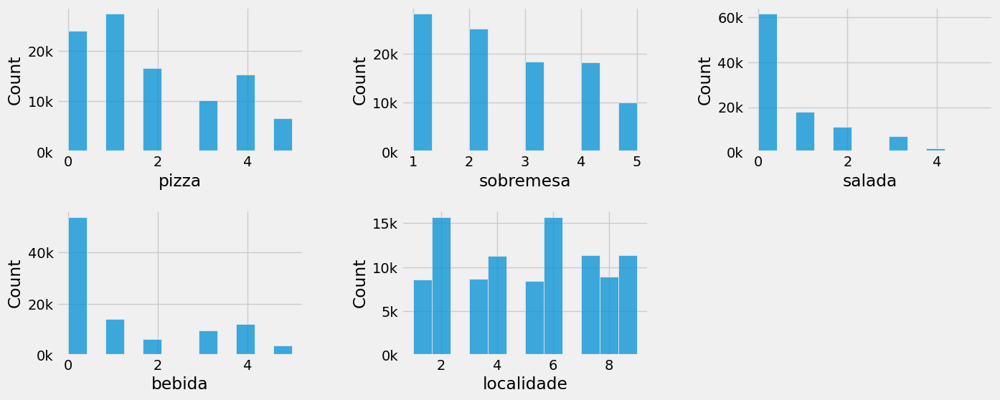

In [53]:
# Plot

# Substitui valores infinitos por NaN
df_item_pedidos.replace([np.inf, -np.inf], np.nan, inplace=True)

# Desativa os avisos temporariamente
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=FutureWarning)
    
    # Tamanho da figura
    plt.figure(1 , figsize = (15 , 6))
    # Inicializa o contador
    n = 0
    
    # Loop pelas colunas
    for x in ['pizza', 'sobremesa', 'salada', 'bebida', 'localidade']:
        
        # configurações gerais do gráfico
        n += 1
        plt.subplot(2, 3, n)
        plt.subplots_adjust(hspace=0.4, wspace=0.4)
        sns.histplot(df_item_pedidos[x], bins=12, kde=False)
        # plt.title(f'{x}')
        
        # Ajusta o formato dos eixos
        plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x/1000)}k'))
        # plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x/10)}k'))

    plt.show()

### Gráfico: Total de pedidos por localidade  <img src="imagens/icons/graficon.png" width="30"/>

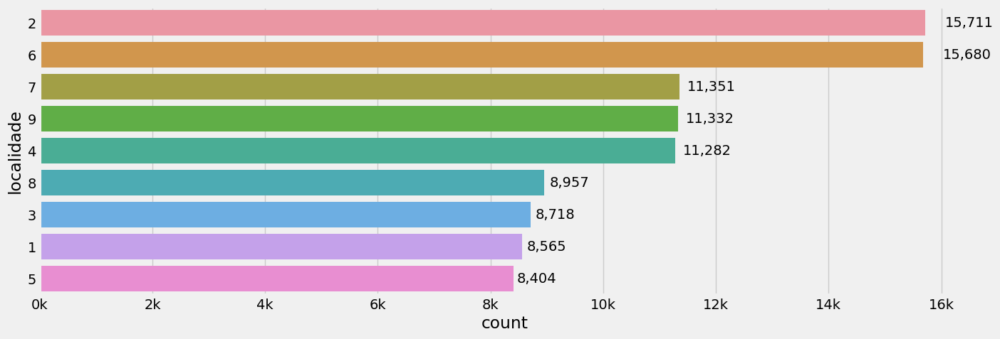

In [54]:
# Conta o número de pedidos por localidade e ordena
localidade_ordem = df_item_pedidos['localidade'].value_counts().index

# Tamanho da figura
plt.figure(figsize=(15, 5))

# Cria o gráfico de contagem
ax = sns.countplot(y='localidade', data=df_item_pedidos, order=localidade_ordem,)

# Adiciona rótulos às barras
for p in ax.patches:
    width = p.get_width()
    ax.text(width + 0.05 * width, p.get_y() + p.get_height() / 2,
            f'{int(width):,}',  # Formata o número com separadores de milhar
            ha='center', va='center')

# Ajusta o formato dos eixos
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x/1000)}k'))

plt.show()

### INSIGHT!!! <img src="imagens/icons/insight.png" width="30"/>

- As localidades 2 e 6 são as que apresentam mais pedidos
- Já as localidades 1 e 5 são as que apresentam menos pedidos
- O maior número de pedidos representa quase o dobro do menor número de pedidos, qual a razão?

### Matriz de Correlação entre os Atributos Usados Para Segmentação <img src="imagens/icons/graficon.png" width="30"/>

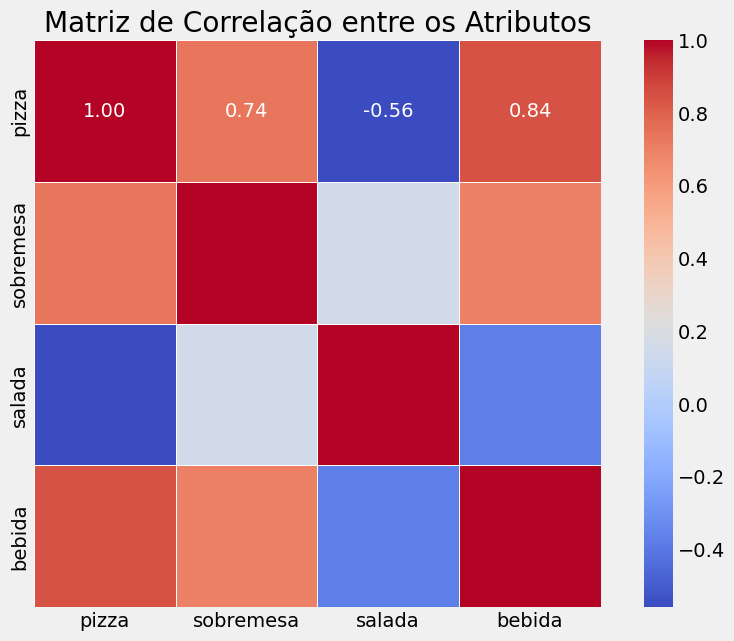

In [55]:
# Calcula a matriz de correlação
correlation_matrix = df_item_pedidos[['pizza', 'sobremesa', 'salada', 'bebida']].corr()

# Tamanho da figura
plt.figure(figsize=(10, 7))

# Plota a matriz de correlação com um mapa de calor, incluindo todos os quadrantes
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, square=True)

plt.title('Matriz de Correlação entre os Atributos')
plt.show()

### Definindo as Variáveis Para Segmentação

Vamos remover id_transacao, horario_pedido, localidade e mes para nossas primeiras atividades de clusterização.

In [56]:
# Filtrando o dataframe por colunas 
df_item_pedidos_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada']]

,index,bebida,pizza,sobremesa,salada
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0
...,...,...,...,...,...
99995,99995,4,4,4,0
99996,99996,0,1,1,0
99997,99997,1,1,1,0
99998,99998,0,2,2,0


In [57]:
# Vamos gerar um novo dataframe com o slice anterior
df = df_item_pedidos_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada']]

In [58]:
# Dataset
df.head()

,index,bebida,pizza,sobremesa,salada
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0


Perfeito. Podemos avançar.

### Análise de Cluster

Clusterização é um processo de aprendizagem não supervisionada, quando entregamos a um algoritmo de Machine Learning somente os dados de entrada e durante o treinamento, o algoritmo cria um modelo capaz de gerar saídas, nesse caso grupos, ou clusters.

![title](imagens/cluster.png)

### Algoritmo de Clusterização - K-means

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

O K-Means Clustering é um algoritmo de aprendizado de máquina não supervisionado. Em contraste com os algoritmos tradicionais de aprendizado de máquina supervisionado, o K-Means tenta classificar dados sem antes ter sido treinado com dados rotulados. Depois que o algoritmo é executado e os grupos são definidos, qualquer novo dado pode ser facilmente atribuído ao grupo mais relevante.


![title](imagens/kmeans.png)

K-Means é provavelmente o algoritmo de agrupamento mais conhecido. É fácil entender e implementar! Confira o gráfico abaixo para obter uma ilustração.

![title](imagens/k-means.gif)


- Para começar, primeiro selecionamos um número de classes / grupos que desejamos e inicializamos aleatoriamente seus respectivos pontos centrais (centróides). Para descobrir o número de classes a serem usadas, é bom dar uma olhada rápida nos dados e tentar identificar grupos distintos. 


- Cada ponto de dados é classificado calculando a distância entre esse ponto e cada centro de grupo e, em seguida, classificando o ponto no grupo cujo centro está mais próximo.


- Com base nesses pontos classificados, recalculamos o centro do grupo, calculando a média de todos os vetores do grupo.


- Repitimos essas etapas para um número definido de iterações ou até que os centros dos grupos não alterem muito entre as iterações. Você também pode optar por inicializar aleatoriamente os centros do grupo algumas vezes e selecionar a execução que parece ter fornecido os melhores resultados.

O K-Means tem a vantagem de ser muito rápido, pois estamos realmente calculando as distâncias entre pontos e centros de grupos; são poucos cálculos! Portanto, possui uma complexidade linear O(n).

Por outro lado, o K-Means tem algumas desvantagens. Primeiro, você deve selecionar quantos grupos / clusters. Isso nem sempre é trivial e, idealmente, com um algoritmo de agrupamento, queremos que ele os descubra, porque o objetivo é obter algumas informações dos dados. 

O K-means também começa com uma escolha aleatória de centros de cluster e, portanto, pode produzir resultados de cluster diferentes em execuções diferentes do algoritmo. Assim, os resultados podem não ser repetíveis e não têm consistência. Outros métodos de cluster são mais consistentes.

K-Medians é outro algoritmo de agrupamento relacionado ao K-Means, exceto que, em vez de recalcular os pontos centrais do grupo usando a média, usamos o vetor de medianas do grupo. Esse método é menos sensível a outliers (por causa do uso da Mediana), mas é muito mais lento para conjuntos de dados maiores, pois a classificação é necessária em cada iteração ao calcular o vetor Mediana.

Outros Algoritmos de Clusterização:
    
- Mean-Shift Clustering
- Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
- Expectation–Maximization (EM) Clustering using Gaussian Mixture Models (GMM)
- Agglomerative Hierarchical Clustering

### Métricas de Clusterização - Definição e Interpretação

Está disponível no manual em pdf no próximo item de aprendizagem.

### Segmentação 1

Vamos realizar nossa primeira segmentação usando 2 variáveis.

#### Segmentação 1 - Definindo o Número de Atributos


Usando 2 Variáveis (Pizza e Sobremesa).

In [59]:
# Usaremos duas variáveis
X1 = df[['pizza' , 'sobremesa']].iloc[: , :].values

In [60]:
# Lista do WCSS
wcss_X1 = []

Muitas vezes, os dados com os quais você trabalha têm várias dimensões, dificultando a visualização. Como consequência, o número ideal de clusters não é muito óbvio. Felizmente, temos uma maneira de determinar isso matematicamente.

Representamos graficamente a relação entre o número de clusters e a soma dos quadrados dentro do cluster (Within Cluster Sum of Squares - WCSS) e, em seguida, selecionamos o número de clusters nos quais a mudança no WCSS começa a se estabilizar (Método Elbow).

#### Segmentação 1 - Encontrando o Valor Ideal de Clusters

Vamos testar diferentes valores de K (valores de cluster) entre 2 e 10.

Para a inicialização dos clusters, usamos o algoritmo k-means++ que oferece convergência mais rápida para o resultado final.

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

In [61]:
# Loop para testar os valores de K
for n in range(2, 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    wcss_X1.append(modelo.inertia_)

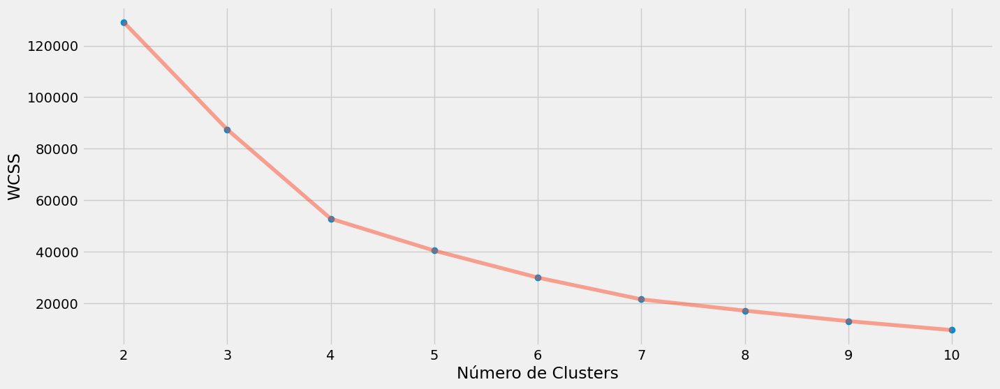

In [62]:
# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_X1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_X1 , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('WCSS')
plt.show()

Escolhemos o valor ideal de clusters e criamos o modelo final para a Segmentação 1. Observe no gráfico acima que não há certo ou errado. Poderíamos trabalhar com qualquer valor entre 2 e 10 (não faz sentido criar apenas 1 cluster).

O gráfico acima é chamado de Curva de Elbow e normalmente usamos o valor com o menor WCSS. Mas isso deve ser alinhado com as necessidade de negócio. Para esse exemplo, não faria sentido usar 10 clusters. Vamos começar com 2 clusters e avaliar e interpretar os resultados.

#### Segmentação 1 - Construindo e Treinando o Modelo

In [63]:
# Criação do modelo
modelo_seg1 = KMeans(n_clusters = 2, 
                     init = 'k-means++', 
                     n_init = 10, 
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan')

In [64]:
# Treinamento do modelo
modelo_seg1.fit(X1)

KMeans(algorithm='elkan', n_clusters=2, n_init=10, random_state=111)

In [65]:
# Extração dos labels
labels1 = modelo_seg1.labels_
labels1

array([0, 0, 1, ..., 0, 0, 0], dtype=int32)

In [66]:
# Extração dos centróides
centroids1 = modelo_seg1.cluster_centers_
centroids1

array([[0.881644  , 1.82183485],
       [3.79958153, 4.05580631]])

Caso queira alterar a combinação de cores dos gráficos, basta alterar a paleta usada. Aqui estão as opções:

https://matplotlib.org/3.2.0/tutorials/colors/colormaps.html

Para o Segmento 1 estamos usando plt.cm.Set2.

#### Segmentação 1 - Visualização e Interpretação dos Segmentos

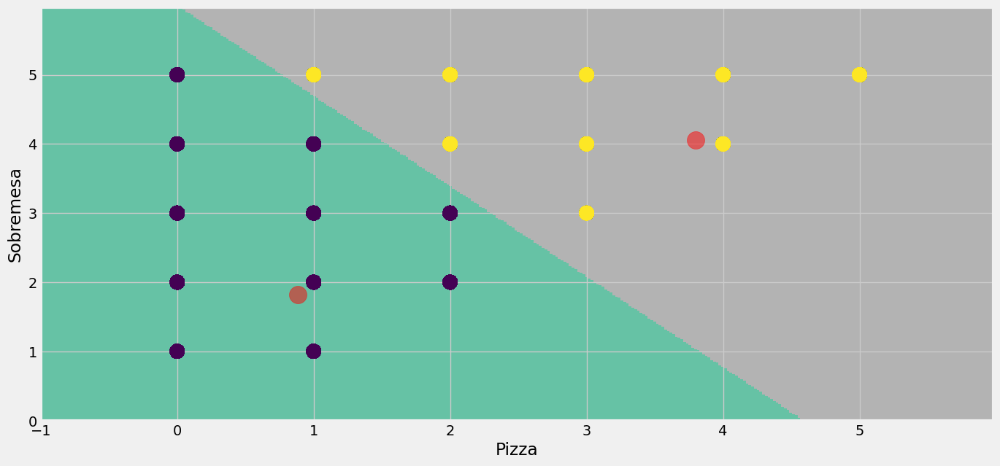

In [67]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg1.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set2, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'sobremesa', data = df, c = labels1, s = 200 )
plt.scatter(x = centroids1[: , 0], y =  centroids1[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Sobremesa')
plt.show()

**Interpretação**: 

- O ponto vermelho é o centróide de cada cluster (segmento).


- No cluster 1 (área em verde) temos os clientes que pediram 0, 1 ou 2 Pizzas. Em todos os casos houve pedido de Sobremesa.


- No cluster 2 (área em cinza) estão clientes que pediram 2, 3, 4 ou 5 Pizzas. Perceba que à medida que o pedido tem maior número de Pizzas, também aumenta o número de Sobremesas.

**Análise**:

- Cluster 1 - Clientes que pedem menos Pizzas. Todos pedem sobremesa.

- Cluster 2 - Clientes que pedem mais Pizzas. Todos pedem sobremesa em volume maior.

Como estratégia de Marketing, poderíamos oferecer ao cliente uma sobremesa grátis no caso de comprar mais uma Pizza de maior valor. Com base na Segmentação provavelmente essa estratégia teria sucesso.

----------------

Vamos criar mais 4 Segmentações:

- Segmentação 2 - Variáveis Pizza e Salada
- Segmentação 3 - Variáveis Pizza e Localidade
- Segmentação 4 - Variáveis Pizza, Salada e Localidade
- Segmentação 5 - Variáveis Pizza, Salada e Sobremesa

### Segmentação 2

Segmentação 2 - Variáveis Pizza e Salada

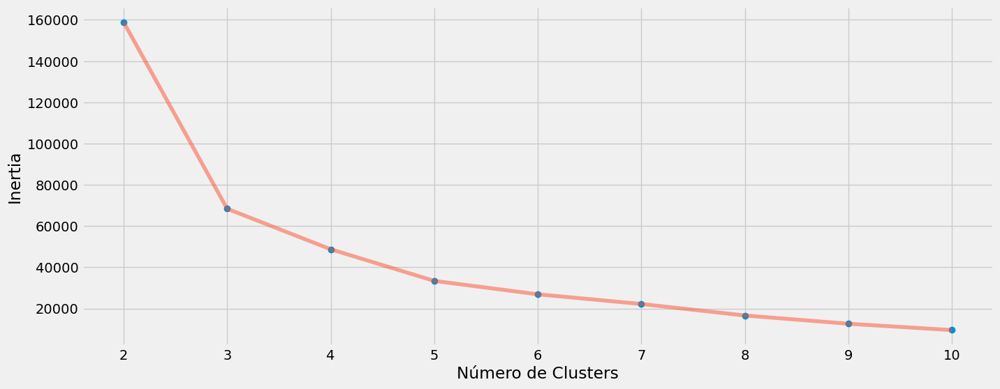

In [68]:
# Usaremos duas variáveis
X1 = df[['pizza' , 'salada']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 3 clusters.

In [69]:
# Criação do modelo com 3 clusters
modelo_seg2 = (KMeans(n_clusters = 3,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg2.fit(X1)

# Labels
labels2 = modelo_seg2.labels_

# Centróides
centroids2 = modelo_seg2.cluster_centers_

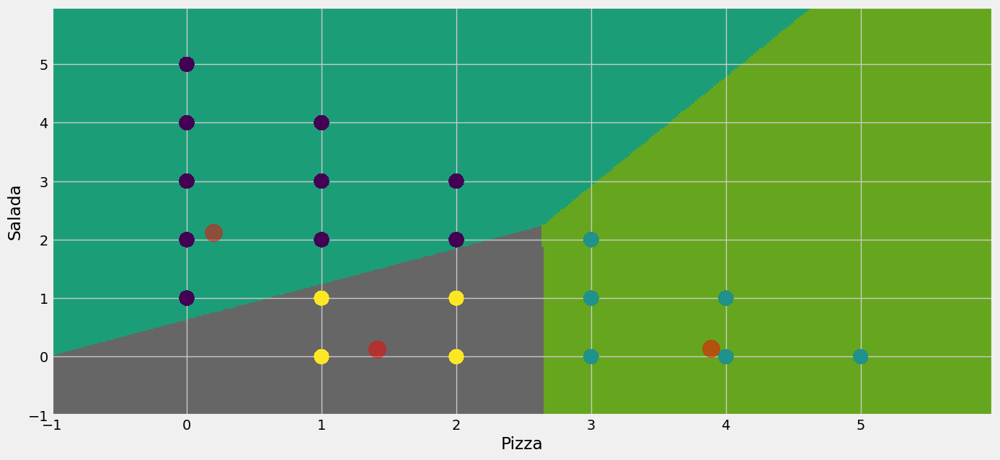

In [70]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg2.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Dark2, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'salada', data = df, c = labels2, s = 200 )
plt.scatter(x = centroids2[: , 0], y =  centroids2[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Salada')
plt.show()

**Interpretação**: 

- O ponto vermelho é o centróide de cada cluster (segmento).


- No cluster 1 (área em cinza) temos os clientes que pediram menos Pizzas e mais Saladas.


- No cluster 2 (área em verde escuro) temos os clientes que pediram poucas Pizzas e poucas Saladas.


- No cluster 3 (área em verde claro) estão clientes que pediram mais Pizzas e menos Saladas.

**Análise**:

Os clusters 1 e 3 são de clientes com comportamentos opostos. A equipe de Marketing poderia concentrar os esforços nos clientes do cluster 2, pois são clientes que compram Pizzas e Saladas e, portanto, tendem a consumir mais itens variados evitando manter os estoques cheios de um único item. 

Ou então, concentrar os esforços nos clientes que consomem produtos que geram mais lucro. Teríamos que verificar qual item, Pizza ou Salada, é mais rentável.

### Segmentação 3

Segmentação 3 - Variáveis Pizza e Localidade

In [71]:
# Filtrando o dataframe por colunas 
df_item_pedidos_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada', 'localidade']]

,index,bebida,pizza,sobremesa,salada,localidade
0,0,0,1,1,0,9
1,1,0,2,2,0,6
2,2,4,4,5,1,9
3,3,0,1,1,0,6
4,4,3,3,3,0,2
...,...,...,...,...,...,...
99995,99995,4,4,4,0,4
99996,99996,0,1,1,0,2
99997,99997,1,1,1,0,2
99998,99998,0,2,2,0,3


In [72]:
# Criando um novo dataframe
df2 = df_item_pedidos_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada', 'localidade']]

In [73]:
# Resumo do dataset
df2.describe()

,index,bebida,pizza,sobremesa,salada,localidade
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,49999.500000,1.239590,1.857840,2.569210,0.711370,5.004700
std,28867.657797,1.627886,1.588589,1.332084,1.086524,2.544811
min,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,24999.750000,0.000000,1.000000,1.000000,0.000000,3.000000
50%,49999.500000,0.000000,1.000000,2.000000,0.000000,5.000000
75%,74999.250000,3.000000,3.000000,4.000000,1.000000,7.000000
max,99999.000000,5.000000,5.000000,5.000000,5.000000,9.000000


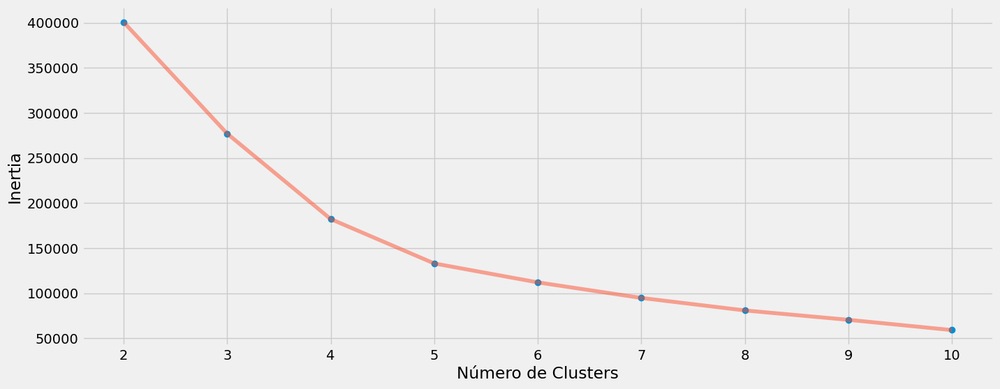

In [74]:
# Usaremos duas variáveis
X1 = df2[['pizza' , 'localidade']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 4 clusters.

In [75]:
# Criação do modelo com 4 clusters
modelo_seg3 = (KMeans(n_clusters = 4,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg3.fit(X1)

# Labels
labels3 = modelo_seg3.labels_

# Centróides
centroids3 = modelo_seg3.cluster_centers_

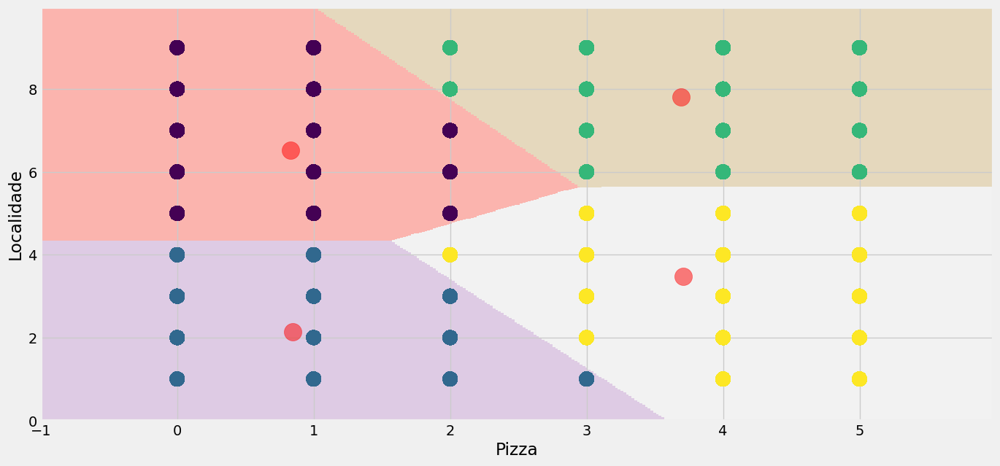

In [76]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg3.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel1, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'localidade', data = df2, c = labels3, s = 200 )
plt.scatter(x = centroids3[: , 0], y =  centroids3[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Localidade')
plt.show()

**Interpretação**: 

- O ponto vermelho é o centróide de cada cluster (segmento).


- Observe que os clusters da esquerda no gráfico contém os pedidos de todas as Localidades, mas com menor número de Pizzas. Já os clusters da direita no gráfico contém pedidos de todas as Localidades com com maior número de Pizzas.

**Análise**:

Queremos aumentar as vendas, certo? Então teríamos que investigar mais a fundo os pedidos dos clusters à esquerda do gráfico e compreender em mais detalhes as características desses pedidos e que tipo de oferta podemos fazer.

### Segmentação 4

Segmentação 4 - Variáveis Pizza, Salada e Localidade

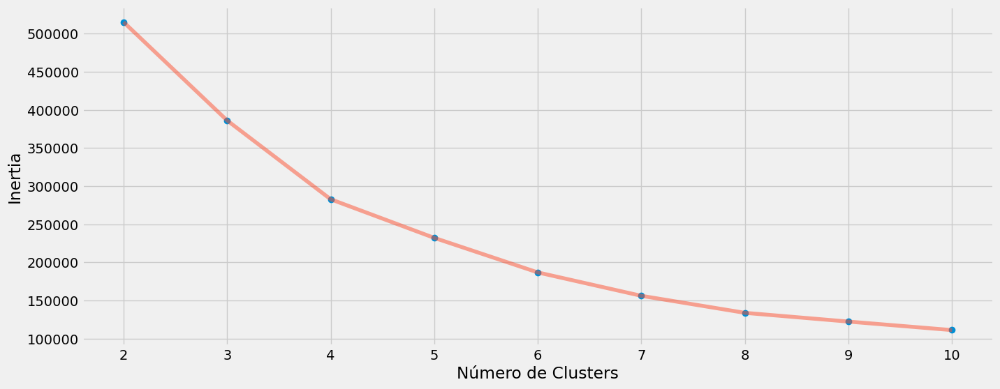

In [77]:
# Usaremos três variáveis
X1 = df2[['pizza' , 'salada' , 'localidade']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 4 clusters.

In [78]:
# Criação do modelo com 4 clusters
modelo_seg4 = (KMeans(n_clusters = 4,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg4.fit(X1)

# Labels
labels4 = modelo_seg4.labels_

# Centróides
centroids4 = modelo_seg4.cluster_centers_

O Meshgrid que criamos até aqui é útil para duas dimensões, mas com 3 dimensões precisamos de um gráfico mais apropriado. Um Scatter3d.

In [ ]:
# Instala o Plotly
# !pip install -q plotly

In [79]:
# Pacotes para o gráfico 3D
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected = True)

In [80]:
# Versões dos pacotes usados neste jupyter notebook
%reload_ext watermark
%watermark -a "Data Science Academy" --iversions

Author: Data Science Academy

numpy     : 1.26.4
plotly    : 5.9.0
seaborn   : 0.12.2
sklearn   : 1.2.2
pandas    : 2.1.4
platform  : 1.0.8
matplotlib: 3.8.0



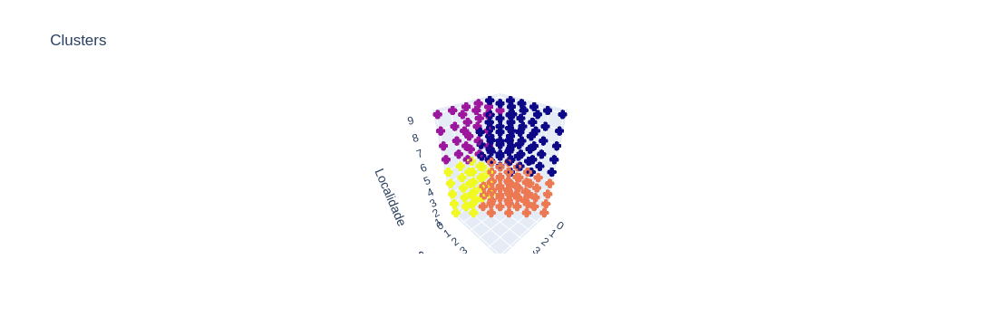

In [82]:
# Plot

# Gráfico 3D
grafico = go.Scatter3d(x = df2['pizza'], 
                       y = df2['salada'], 
                       z = df2['localidade'], 
                       mode = 'markers', 
                       marker = dict(color = labels4, 
                                     size = 4,
                                     line = dict(color = labels4, width = 15),
                                     opacity = 0.7))

# Layout do gráfico
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salada'),
                                zaxis = dict(title  = 'Localidade')))

# Plot da figura (gráfico + layout)
fig = go.Figure(data = grafico, layout = layout)
py.offline.iplot(fig)

**Interpretação**: 

- Observamos 2 clusters inferiores e 2 superiores.


- Cada ponto de dado representa uma coordenada de 3 dimensões.

**Análise**:

Aqui o ideal é avaliar o gráfico de forma interativa aproveitando essa propriedade do Plotly.

### Segmentação 5

Segmentação 5 - Variáveis Pizza, Salada e Sobremesa

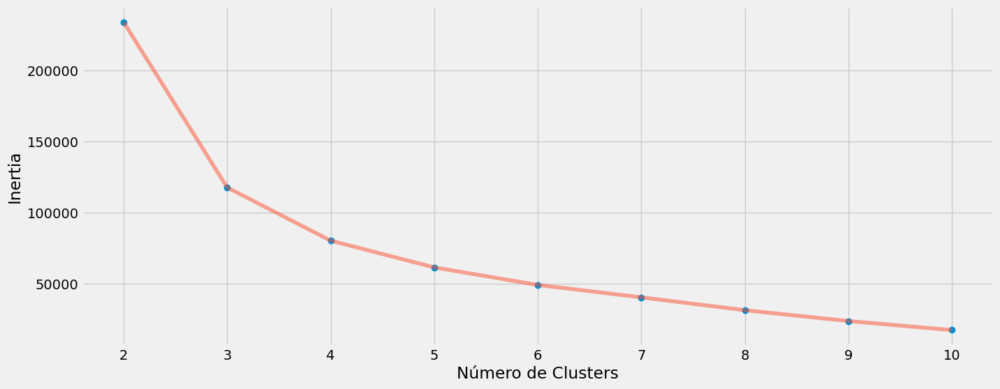

In [83]:
# Usaremos três variáveis
X1 = df2[['pizza' , 'salada' , 'sobremesa']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 2 clusters.

In [84]:
# Criação do modelo com 2 clusters
modelo_seg5 = (KMeans(n_clusters = 2,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg5.fit(X1)

# Labels
labels5 = modelo_seg5.labels_

# Centróides
centroids5 = modelo_seg5.cluster_centers_

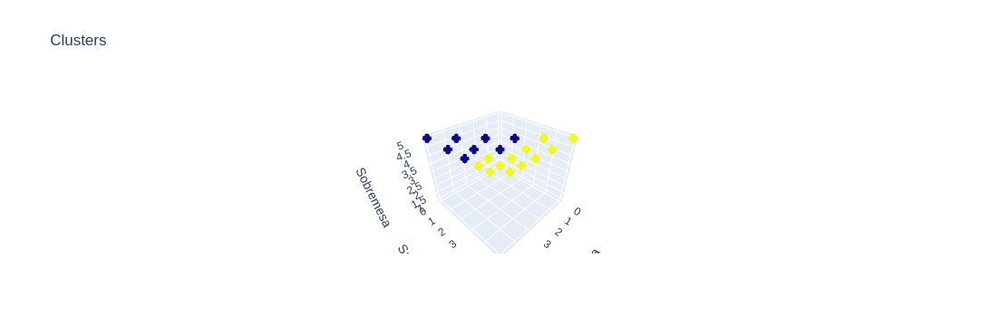

In [86]:
# Plot

# Gráfico 3D
grafico = go.Scatter3d(x = df2['pizza'], 
                       y = df2['salada'], 
                       z = df2['sobremesa'], 
                       mode = 'markers', 
                       marker = dict(color = labels5, 
                                     size = 4,
                                     line = dict(color = labels5, width = 15),
                                     opacity = 0.7))

# Layout do gráfico
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salada'),
                                zaxis = dict(title  = 'Sobremesa')))

# Plot da figura (gráfico + layout)
fig = go.Figure(data = grafico, layout = layout)
py.offline.iplot(fig)

**Interpretação**: 

- Observamos a clara separação entre os dados dois 2 clusters.


- Cada ponto de dado representa uma coordenada de 3 dimensões.

**Análise**:

Aqui o ideal é avaliar o gráfico de forma interativa aproveitando essa propriedade do Plotly.

**Exemplo de Relatório final (Considerando a Segmentação 5)**

In [87]:
# Shape dos labels
labels5.shape

(100000,)

In [88]:
# Tipo
type(labels5)

numpy.ndarray

In [89]:
# Converte o array para dataframe
df_labels = pd.DataFrame(labels5)

In [90]:
# Visualiza
df_labels.head(5)

,0
0,1
1,1
2,0
3,1
4,0


In [91]:
# Tipo
type(df_labels)

pandas.core.frame.DataFrame

In [92]:
# Vamos fazer o merge de df2 e os labels (clusters) encontrados pelo modelo
# Lembre-se que usamos somente 3 variáveis para criar a segmentação
df_final = df2.merge(df_labels, left_index = True, right_index = True)

In [93]:
# Visualiza
df_final

,index,bebida,pizza,sobremesa,salada,localidade,0
0,0,0,1,1,0,9,1
1,1,0,2,2,0,6,1
2,2,4,4,5,1,9,0
3,3,0,1,1,0,6,1
4,4,3,3,3,0,2,0
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,0
99996,99996,0,1,1,0,2,1
99997,99997,1,1,1,0,2,1
99998,99998,0,2,2,0,3,1


In [94]:
# Ajusta o nome da coluna
df_final.rename(columns = {0:"cluster"}, inplace = True)

In [95]:
# Visualiza
df_final

,index,bebida,pizza,sobremesa,salada,localidade,cluster
0,0,0,1,1,0,9,1
1,1,0,2,2,0,6,1
2,2,4,4,5,1,9,0
3,3,0,1,1,0,6,1
4,4,3,3,3,0,2,0
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,0
99996,99996,0,1,1,0,2,1
99997,99997,1,1,1,0,2,1
99998,99998,0,2,2,0,3,1


---------

## Considerações Finais

Esse é um projeto aberto!
Ainda é possível fazer modificações nos hiperparâmetros do modelo, usar diferentes números de clusters, de modo a comparar os resultados.
Quanto mais insights são gerados, mais as áreas de negócio terão base para melhores decisões!

# Fim 